# Data Visualization

Visualize the data to gain insights

In [2]:
# Set configuration for notebook
import os

os.chdir('c:\\Users\\Spectra\\flood-prediction')
os.getcwd()

'c:\\Users\\Spectra\\flood-prediction'

In [3]:
# Import the necessary libraries
import folium
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
from src.utils import load_config

In [4]:
# load the config
config = load_config()

In [5]:
# Load the processed data
processed_flood_df = pd.read_csv(config["data"]["processed_data_path"])

In [6]:
# View data
processed_flood_df.head()

,Sl,Station_Names,Year,Month,Max_Temp,Min_Temp,Rainfall,Relative_Humidity,Wind_Speed,Cloud_Coverage,Bright_Sunshine,Station_Number,X_COR,Y_COR,LATITUDE,LONGITUDE,ALT,Period,Flood
0,0,Barisal,1949,1,29.4,12.3,0.0,68.0,0.453704,0.6,7.831915,41950,536809.8,510151.9,22.7,90.36,4,1949.01,0
1,1,Barisal,1949,2,33.9,15.2,9.0,63.0,0.659259,0.9,8.314894,41950,536809.8,510151.9,22.7,90.36,4,1949.02,0
2,2,Barisal,1949,3,36.7,20.2,8.0,59.0,1.085185,1.5,8.131915,41950,536809.8,510151.9,22.7,90.36,4,1949.03,0
3,3,Barisal,1949,4,33.9,23.9,140.0,71.0,1.772222,3.9,8.219149,41950,536809.8,510151.9,22.7,90.36,4,1949.04,0
4,4,Barisal,1949,5,35.6,25.0,217.0,76.0,1.703704,4.1,7.046809,41950,536809.8,510151.9,22.7,90.36,4,1949.05,0


In [7]:
df = processed_flood_df.copy()

## Data Visualization

**1. What is the distribution of the target variable (Flood)?** 

2024-05-08 17:57:01,563 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


2024-05-08 17:57:01,593 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


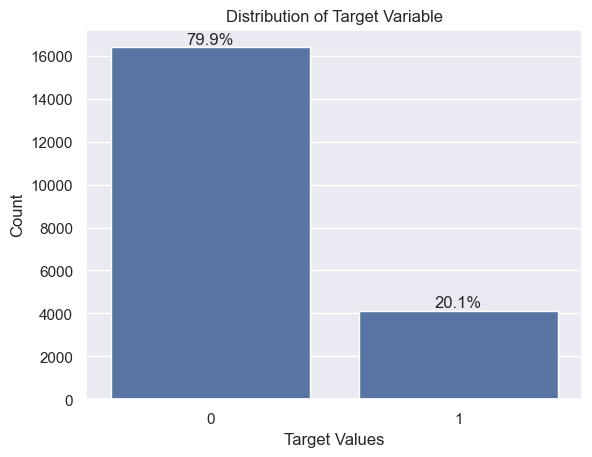

In [17]:
sns.set(style="darkgrid")
ax = sns.countplot(data=processed_flood_df, x="Flood")

# Add percentages on top of each bar
total = len(df["Flood"])
for p in ax.patches:
    percentage = "{:.1f}%".format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(percentage, (x, y), ha="center", va="bottom")

plt.title("Distribution of Target Variable")
plt.xlabel("Target Values")
plt.ylabel("Count")
plt.show()

The data is imbalanced with 20% being the data showcasing flooding incidents.

**2. Time series analysis for various locations**

C:\Users\Spectra\AppData\Local\Temp\ipykernel_24876\2389183286.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2013['Date'] = pd.to_datetime(df_2013[['Year', 'Month']].assign(DAY=1))


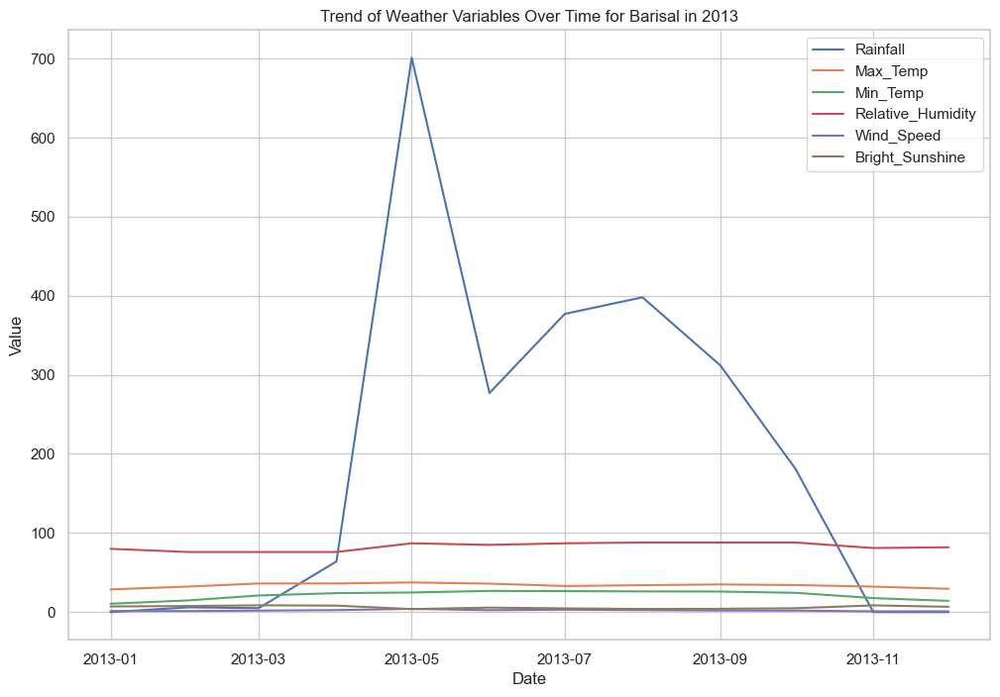

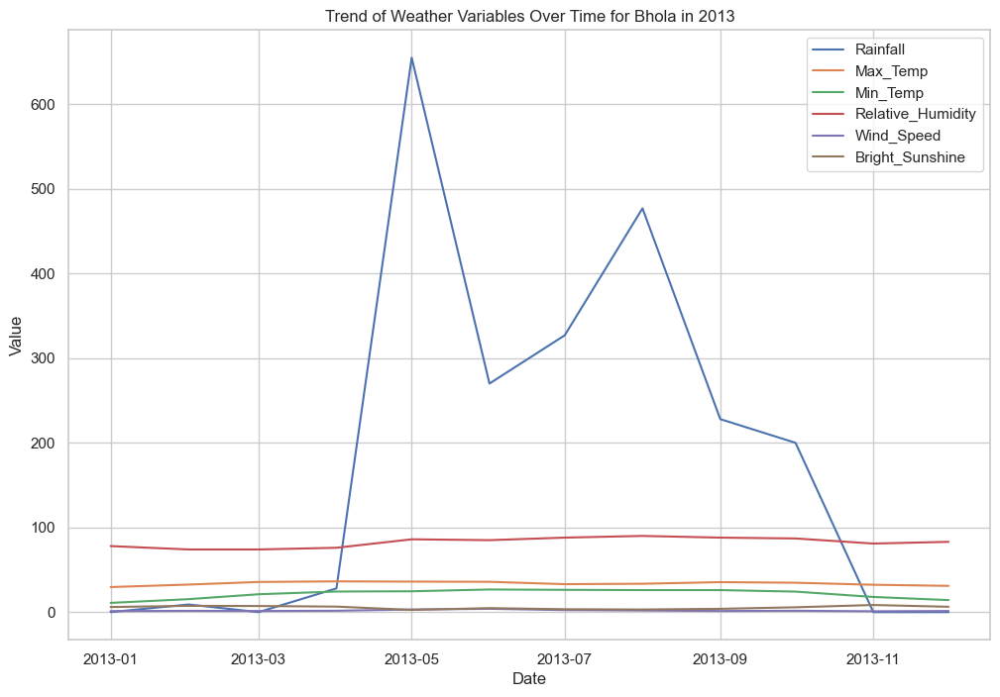

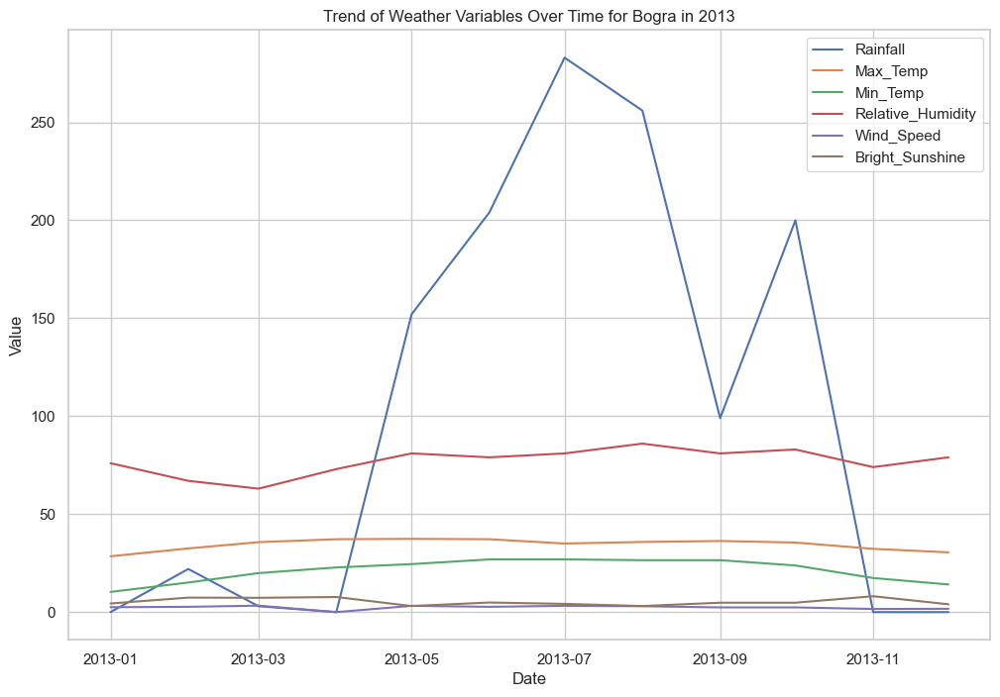

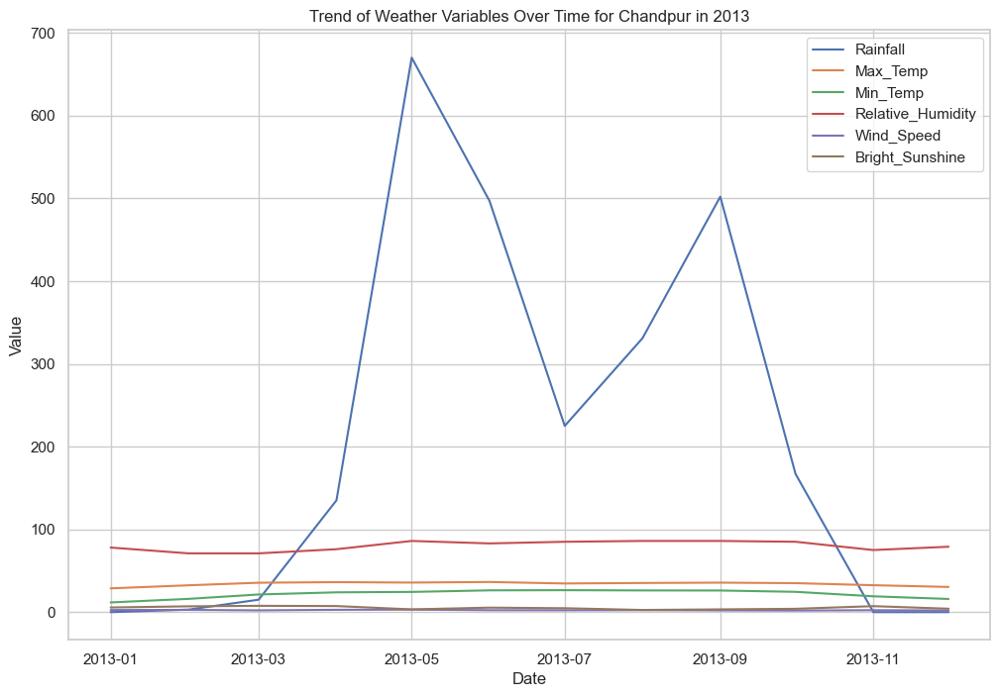

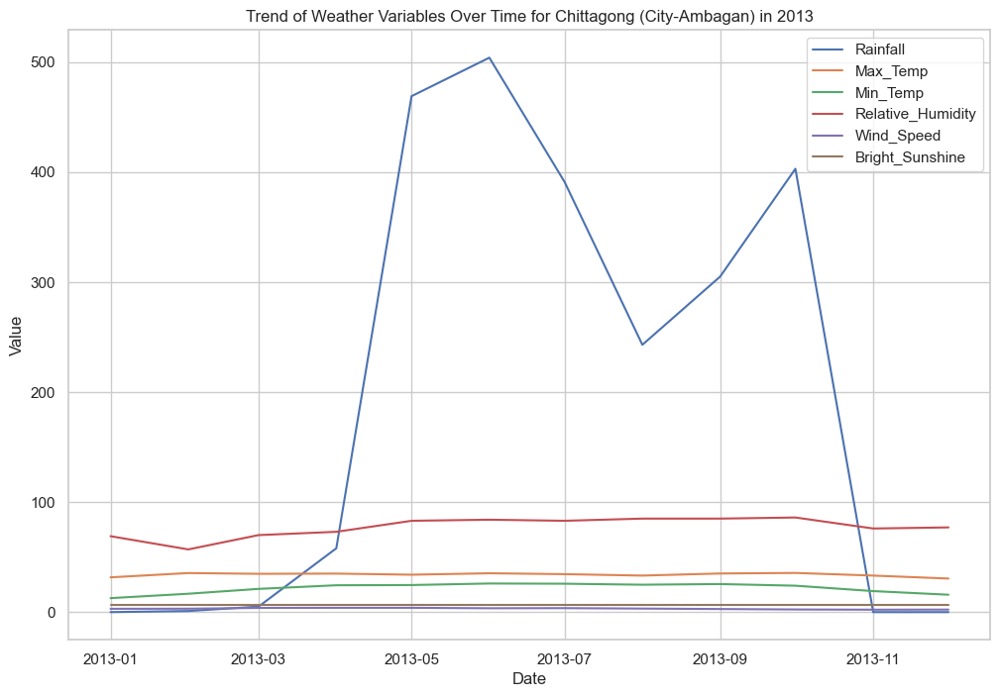

...

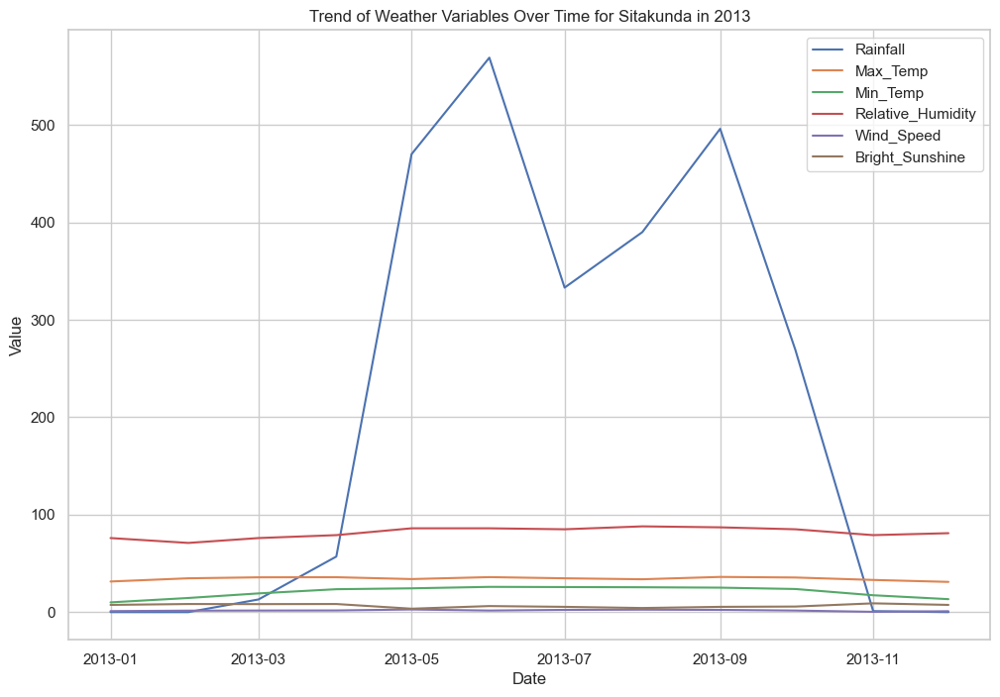

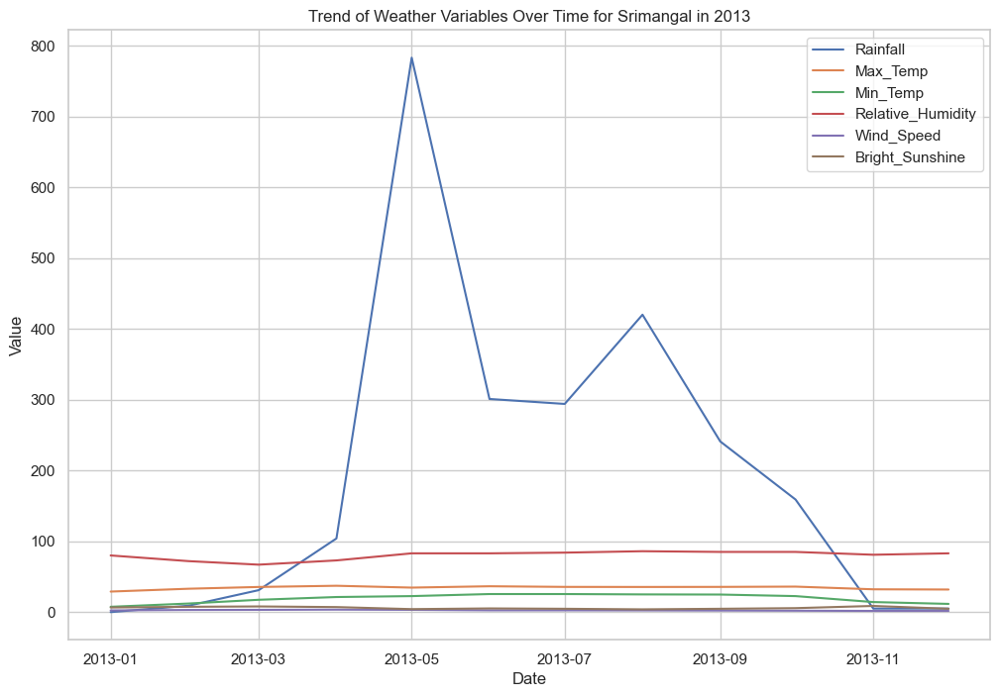

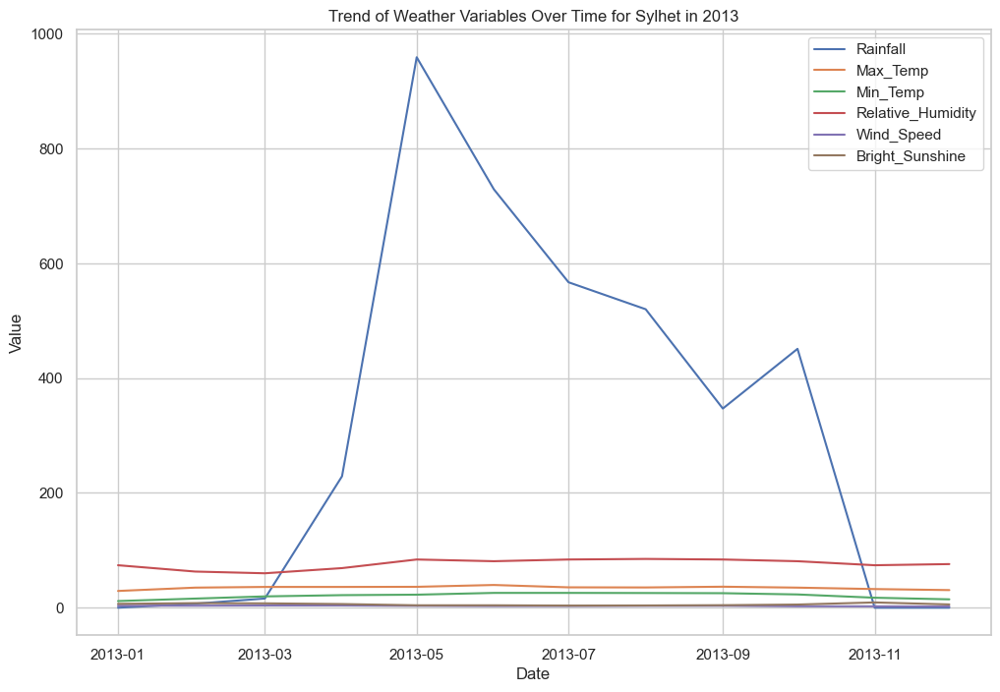

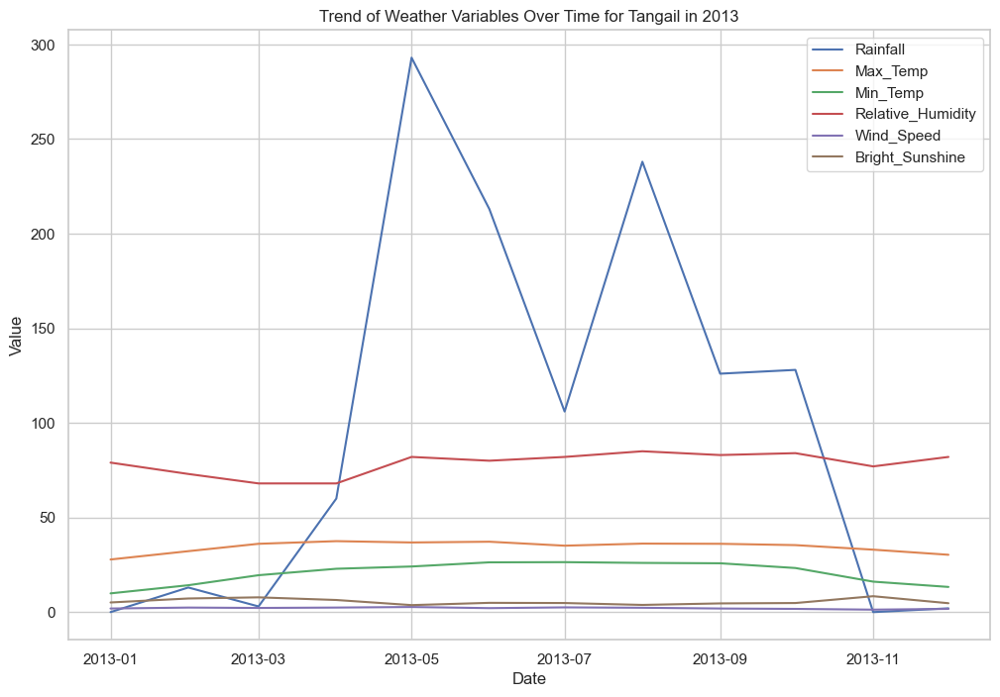

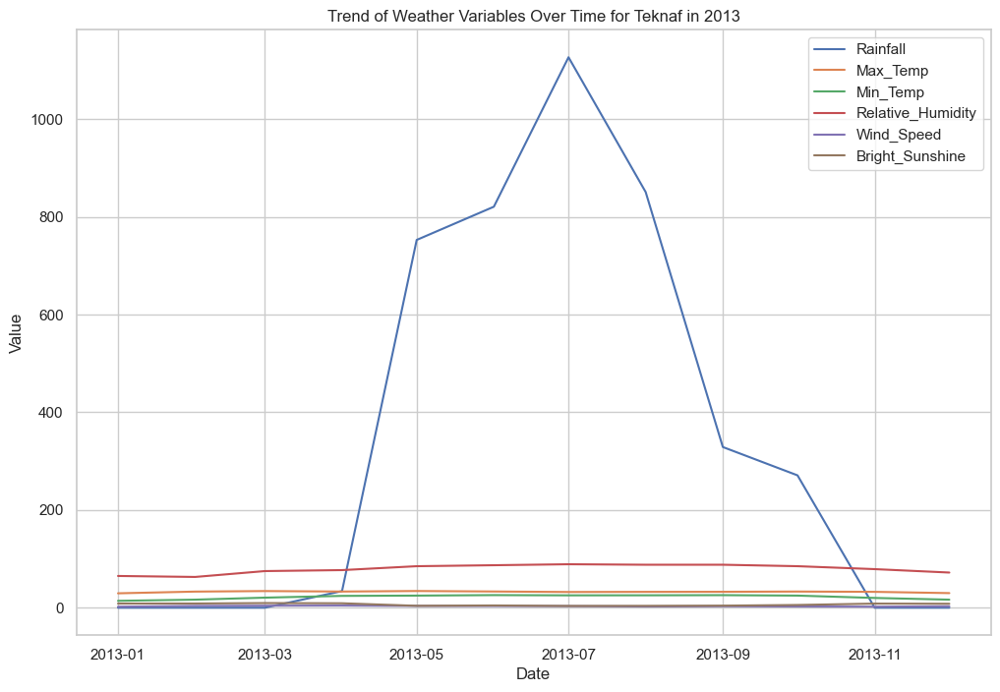

In [21]:
# See the plot for 2013

df_2013 = df[df["Year"] == 2013]

# Define the locations
locations = ["Barisal", "Bhola", "Bogra", "Chandpur", "Chittagong (City-Ambagan)", 
             "Chittagong (IAP-Patenga)", "Comilla", "Cox"s Bazar", "Dhaka", 
             "Dinajpur", "Faridpur", "Feni", "Hatiya", "Ishurdi", "Jessore", 
             "Khepupara", "Khulna", "Kutubdia", "Madaripur", "Maijdee Court", 
             "Mongla", "Mymensingh", "Patuakhali", "Rajshahi", "Rangamati", 
             "Rangpur", "Sandwip", "Satkhira", "Sitakunda", "Srimangal", 
             "Sylhet", "Tangail", "Teknaf"]

# Define the variables to plot
variables = ["Rainfall", "Max_Temp", "Min_Temp", "Relative_Humidity", "Wind_Speed", "Bright_Sunshine"]

# Set the "Date" column as the index
df_2013["Date"] = pd.to_datetime(df_2013[["Year", "Month"]].assign(DAY=1))
df_2013.set_index("Date", inplace=True)

# Plot the trend of each variable for each location
sns.set_style("whitegrid")
for location in locations:
    # Filter data for the current location
    location_data = df_2013[df_2013["Station_Names"] == location]
    
    # Plot the trend of each variable using seaborn"s lineplot
    plt.figure(figsize=(12, 8))
    for variable in variables:
        sns.lineplot(x=location_data.index, y=location_data[variable], label=variable)

    # Set the title and labels
    plt.title(f"Trend of Weather Variables Over Time for {location} in 2013")
    plt.xlabel("Date")
    plt.ylabel("Value")

    # Show the legend
    plt.legend()

    # Show the plot
    plt.show()

C:\Users\Spectra\AppData\Local\Temp\ipykernel_24876\2006619219.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2010_2013['Date'] = pd.to_datetime(df_2010_2013[['Year', 'Month']].assign(DAY=1))


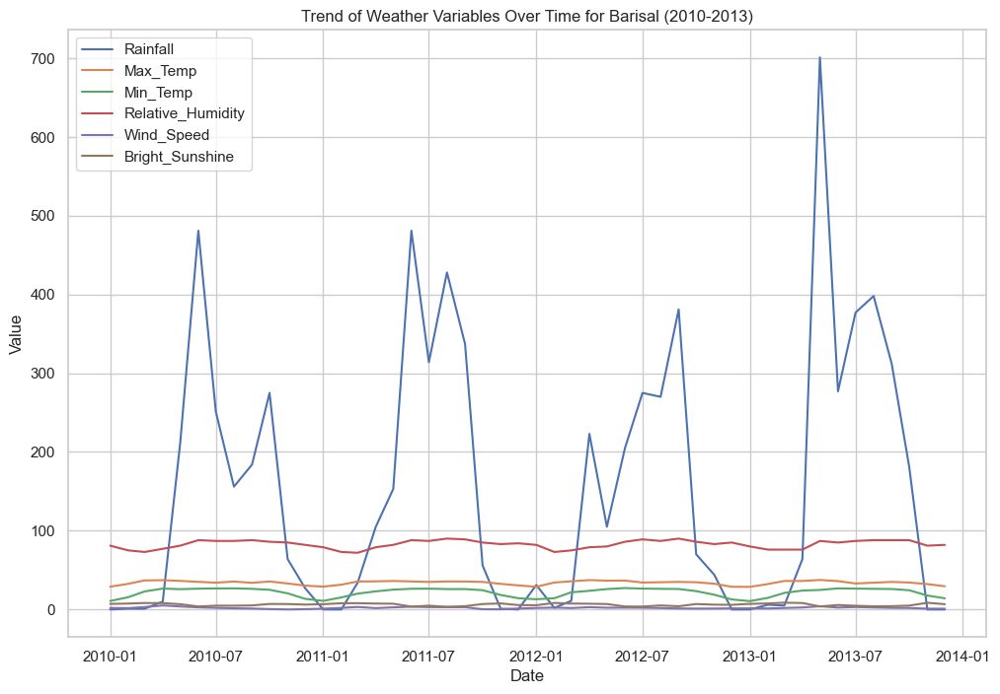

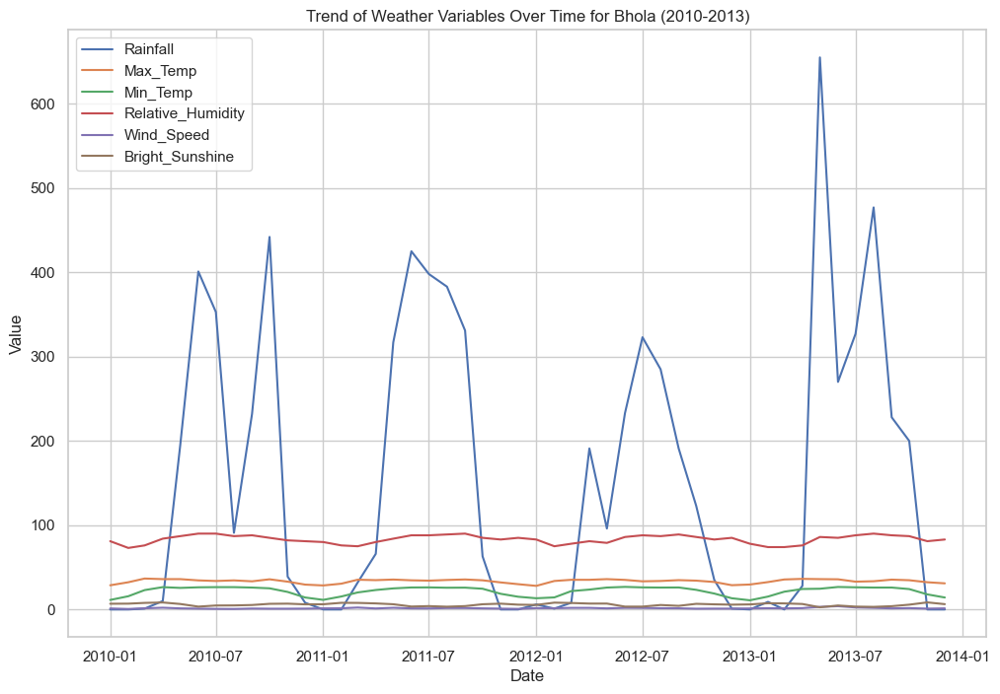

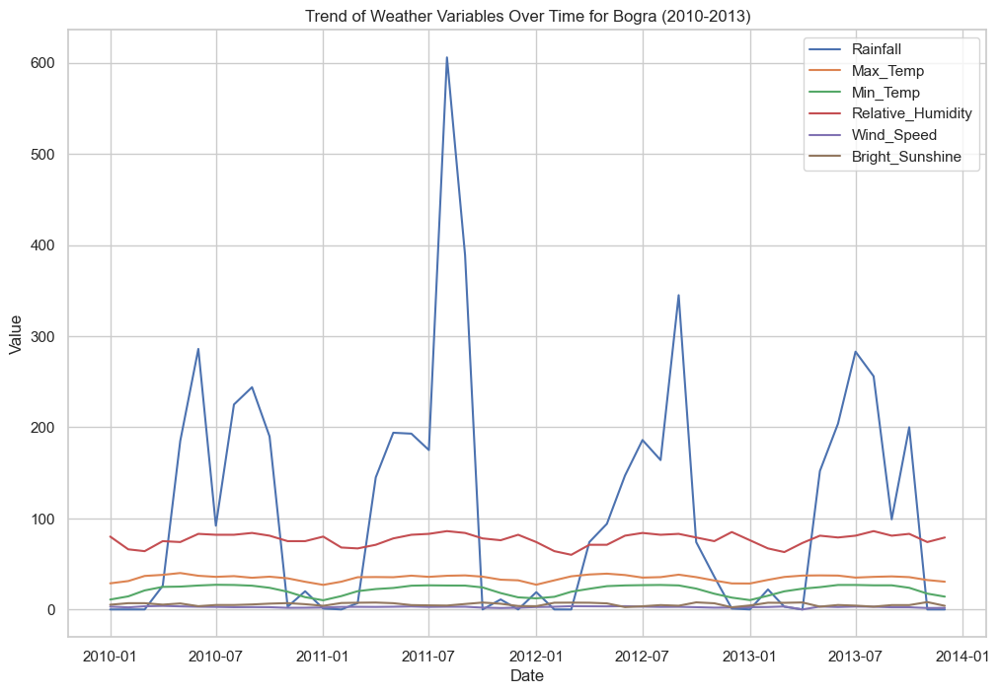

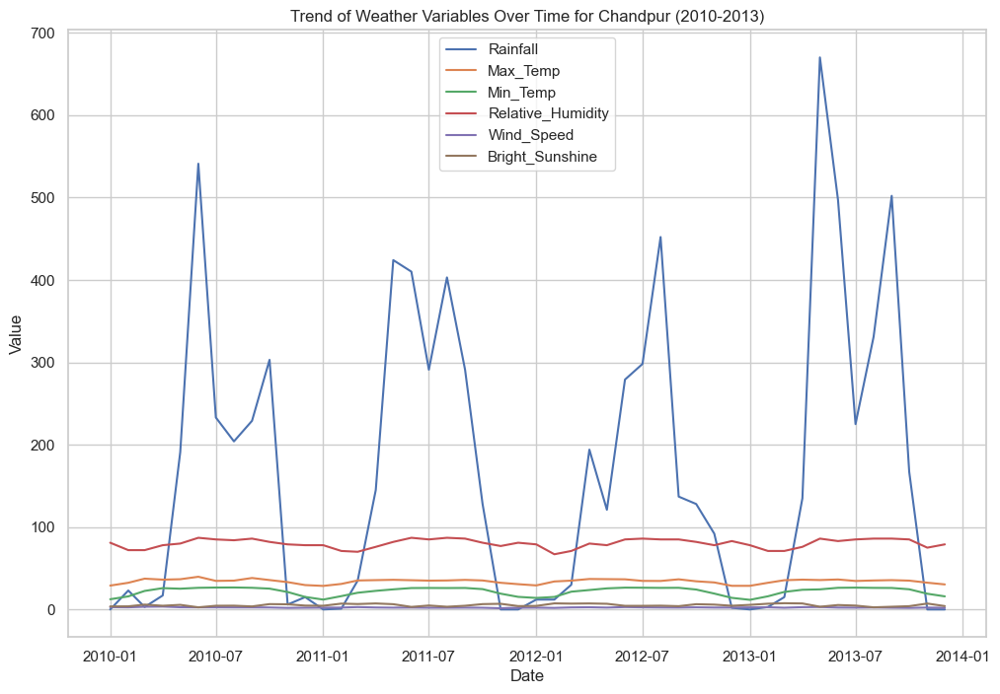

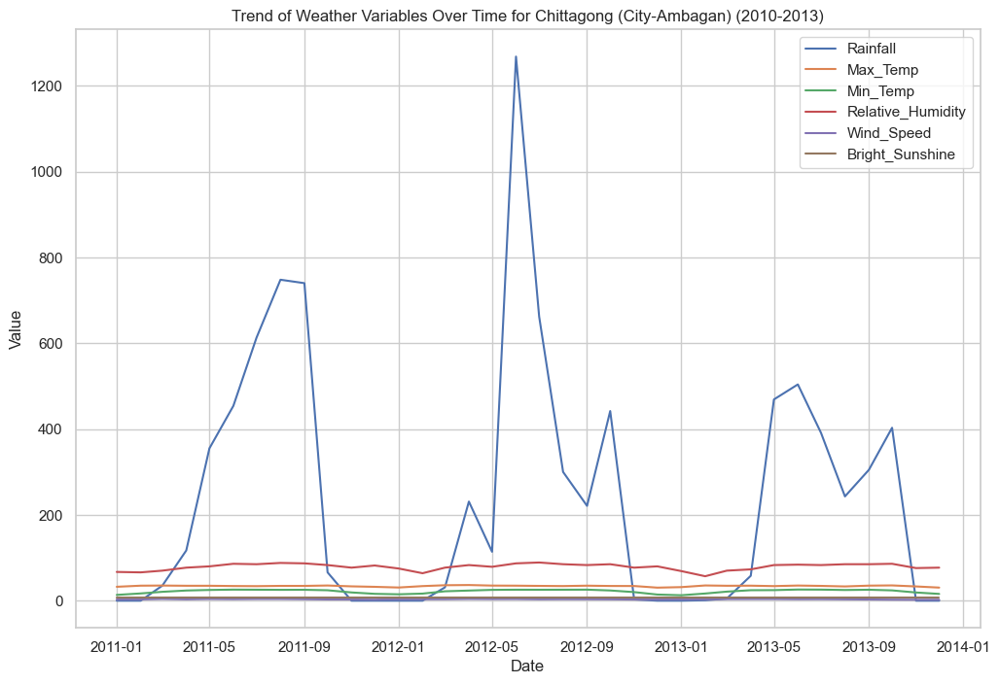

...

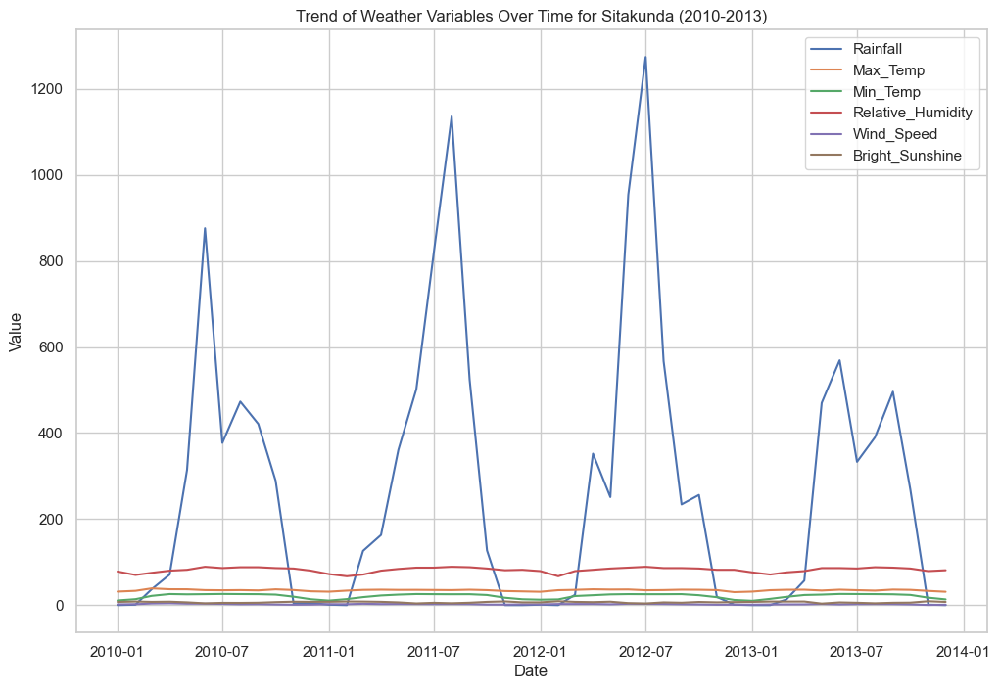

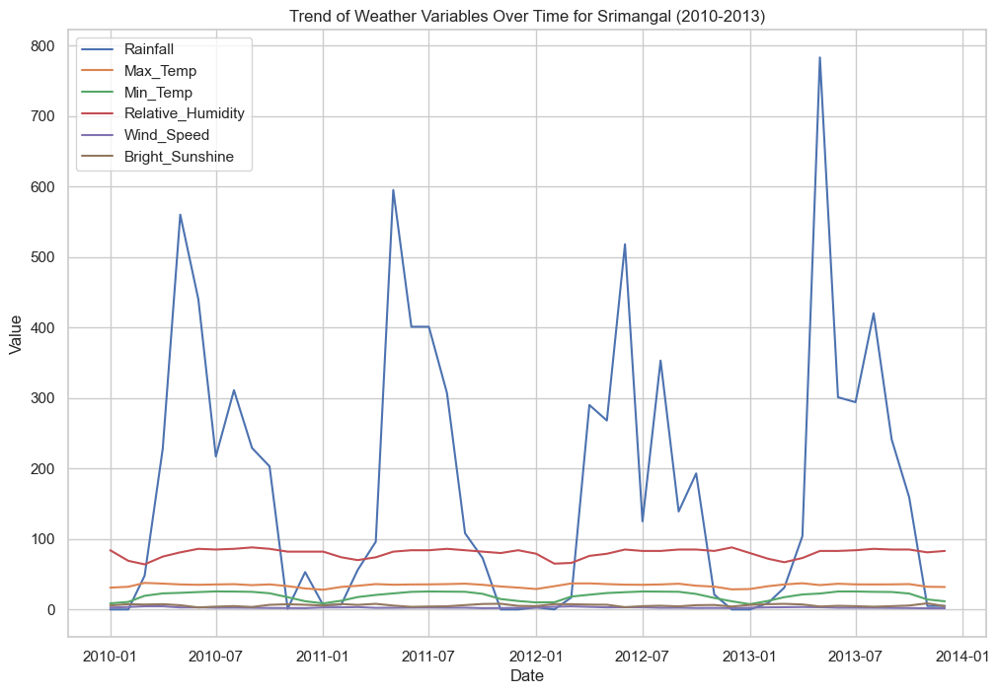

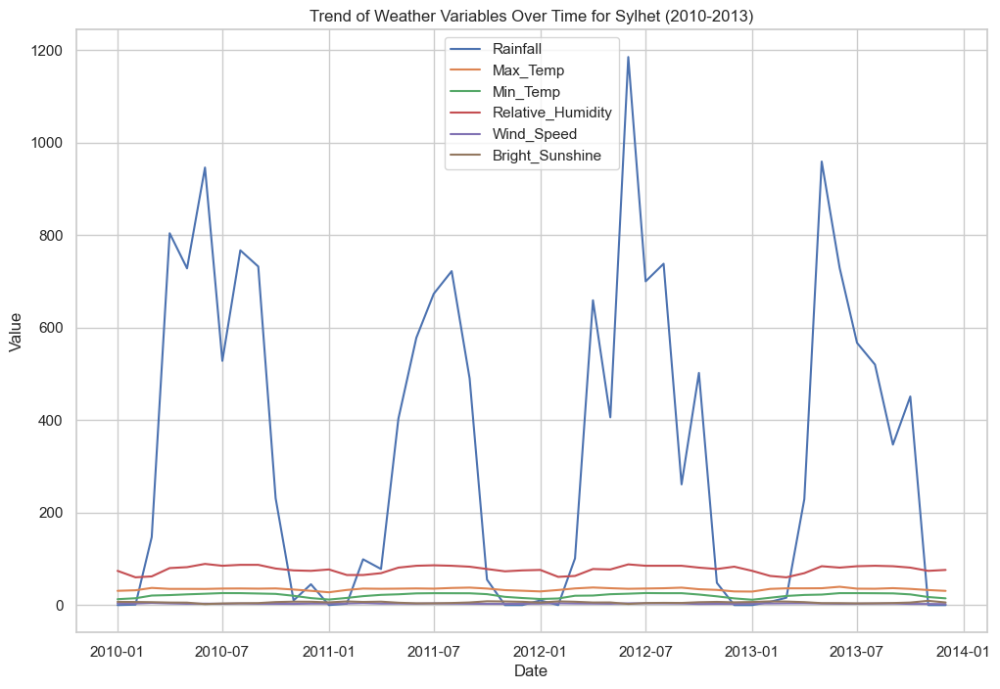

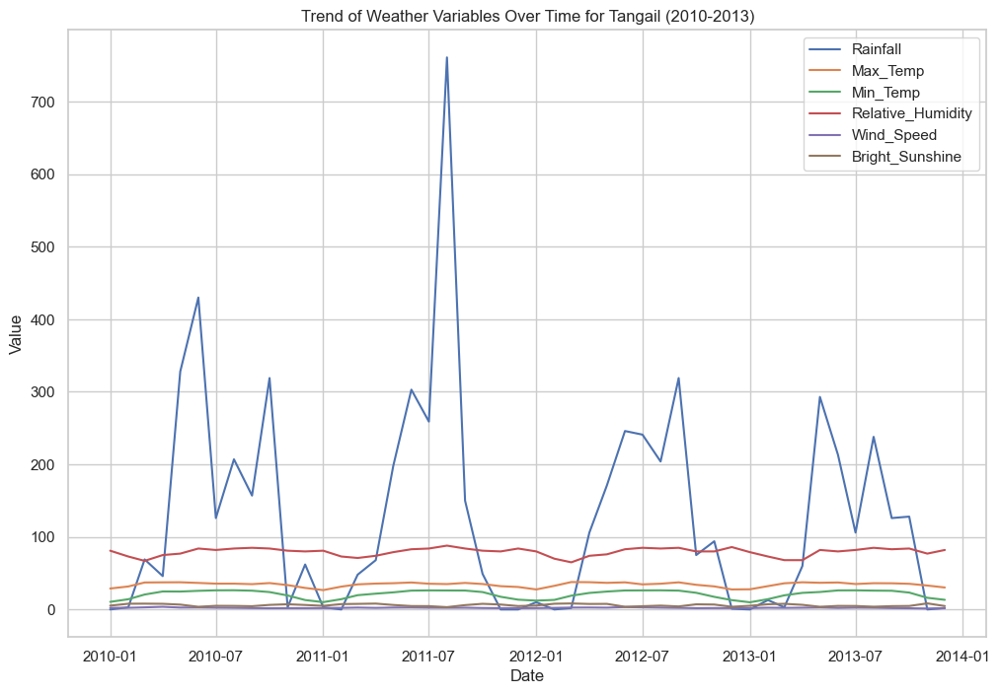

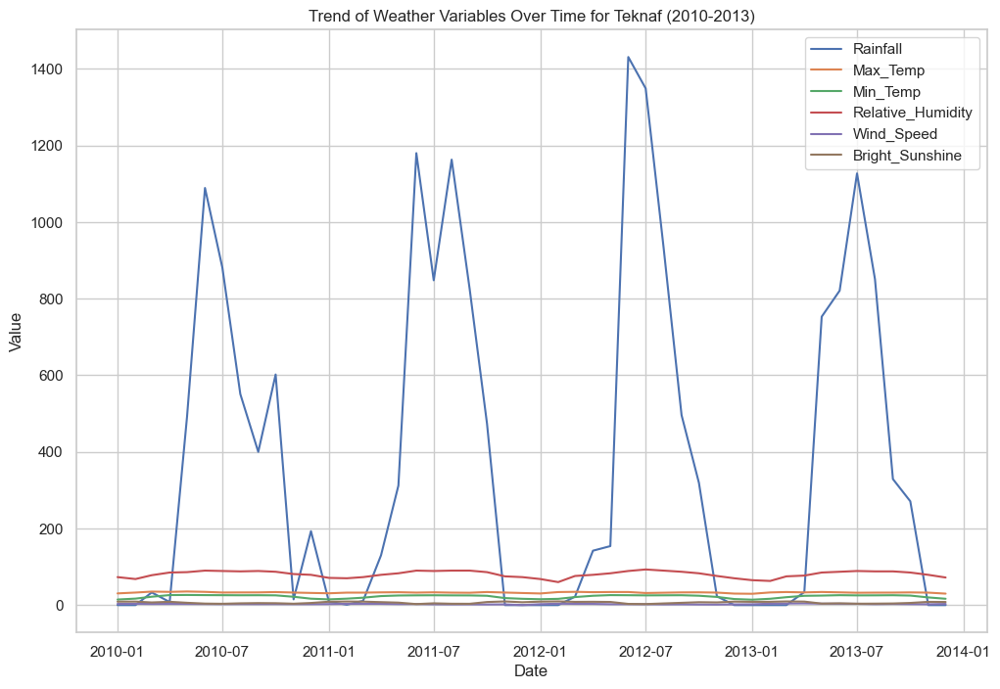

In [22]:
# Filter data for the years 2010 to 2013
df_2010_2013 = df[(df["Year"] >= 2010) & (df["Year"] <= 2013)]

# Define the locations
locations = ["Barisal", "Bhola", "Bogra", "Chandpur", "Chittagong (City-Ambagan)", 
             "Chittagong (IAP-Patenga)", "Comilla", "Cox"s Bazar", "Dhaka", 
             "Dinajpur", "Faridpur", "Feni", "Hatiya", "Ishurdi", "Jessore", 
             "Khepupara", "Khulna", "Kutubdia", "Madaripur", "Maijdee Court", 
             "Mongla", "Mymensingh", "Patuakhali", "Rajshahi", "Rangamati", 
             "Rangpur", "Sandwip", "Satkhira", "Sitakunda", "Srimangal", 
             "Sylhet", "Tangail", "Teknaf"]

# Define the variables to plot
variables = ["Rainfall", "Max_Temp", "Min_Temp", "Relative_Humidity", "Wind_Speed", "Bright_Sunshine"]

# Set the "Date" column as the index
df_2010_2013["Date"] = pd.to_datetime(df_2010_2013[["Year", "Month"]].assign(DAY=1))
df_2010_2013.set_index("Date", inplace=True)

# Plot the trend of each variable for each location
sns.set_style("whitegrid")
for location in locations:
    # Filter data for the current location
    location_data = df_2010_2013[df_2010_2013["Station_Names"] == location]
    
    # Plot the trend of each variable using seaborn"s lineplot
    plt.figure(figsize=(12, 8))
    for variable in variables:
        sns.lineplot(x=location_data.index, y=location_data[variable], label=variable)

    # Set the title and labels
    plt.title(f"Trend of Weather Variables Over Time for {location} (2010-2013)")
    plt.xlabel("Date")
    plt.ylabel("Value")

    # Show the legend
    plt.legend()

    # Show the plot
    plt.show()

From this we can see seasonality in the variables with heavy spikes in rainfall changes over time.

**3. What is the correlation of the variables to floods**

In [8]:
# Define the mapping dictionary
location_mapping = {
    'Barisal': 0,
    'Bhola': 1,
    'Bogra': 2,
    'Chandpur': 3,
    'Chittagong (City-Ambagan)': 4,
    'Chittagong (IAP-Patenga)': 5,
    'Comilla': 6,
    "Cox's Bazar": 7,
    'Dhaka': 8,
    'Dinajpur': 9,
    'Faridpur': 10,
    'Feni': 11,
    'Hatiya': 12,
    'Ishurdi': 13,
    'Jessore': 14,
    'Khepupara': 15,
    'Khulna': 16,
    'Kutubdia': 17,
    'Madaripur': 18,
    'Maijdee Court': 19,
    'Mongla': 20,
    'Mymensingh': 21,
    'Patuakhali': 22,
    'Rajshahi': 23,
    'Rangamati': 24,
    'Rangpur': 25,
    'Sandwip': 26,
    'Satkhira': 27,
    'Sitakunda': 28,
    'Srimangal': 29,
    'Sylhet': 30,
    'Tangail': 31,
    'Teknaf': 32
}

# Map the locations to numerical values
df['Location_Number'] = df['Station_Names'].map(location_mapping)

In [9]:
corr_df = df.drop(["Station_Names"], axis=1)

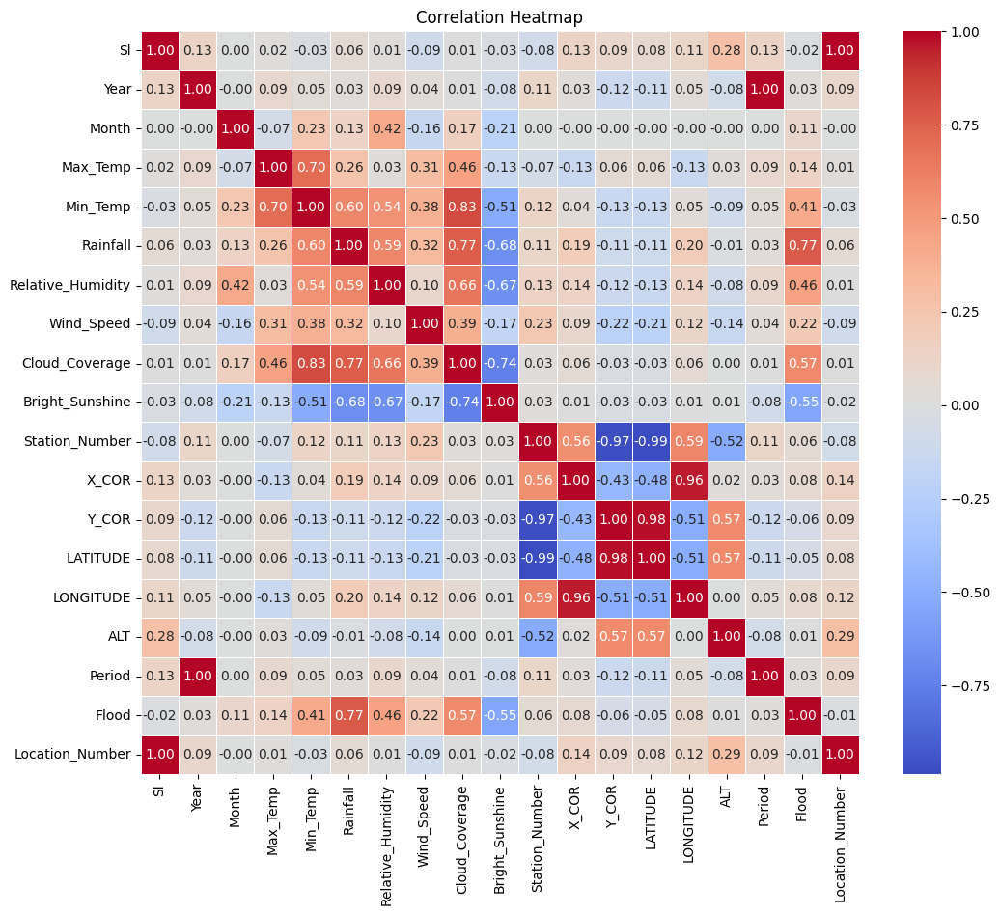

In [10]:
# Calculate the correlation matrix
correlation_matrix = corr_df.corr()


# Plot the correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5)
plt.title("Correlation Heatmap")
plt.show()

We can see that rainfall, humidity, cloud coverage and sunshine have a huge correlation to floods

**4. What locations flood often?**

In [22]:

# Filter DataFrame to include only rows where flooding has occurred
flooded_locations = df[df["Flood"] == 1]

# Create a map centered around the mean latitude and longitude of your data
map_center = [df["LATITUDE"].mean(), df["LONGITUDE"].mean()]
mymap = folium.Map(location=map_center, zoom_start=6)  # Adjust the zoom level as needed

# Add markers for flooded locations with popups
for index, row in flooded_locations.iterrows():
    marker_location = [row["LATITUDE"], row["LONGITUDE"]]
    popup_text = f"Station Name: {row["Station_Names"]}\nFlood Occurred"
    folium.Marker(location=marker_location, popup=popup_text, icon=folium.Icon(color="red")).add_to(mymap)

# Save the map as an HTML file
mymap.save("flooded_locations_map.html")
mymap

It can be seen that the locations that flood the most are locations that are very close to waterbodies.